# OpenCV Tutorial - Computer Vision Course
## Isfahan University of Technology
### Based on Chapter 2: Images and Their Properties

This notebook teaches you OpenCV step by step based on your course material.

In [47]:
# Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Configure matplotlib for inline display
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)

print("✓ Libraries imported successfully!")
print(f"OpenCV version: {cv2.__version__}")

✓ Libraries imported successfully!
OpenCV version: 4.12.0


## 1. Loading and Displaying Images (اسلاید 8-9)

In OpenCV, images are stored as NumPy arrays (Mat structure).

Grayscale image shape: (900, 1600)
Color image shape: (900, 1600, 3)
Data type: uint8


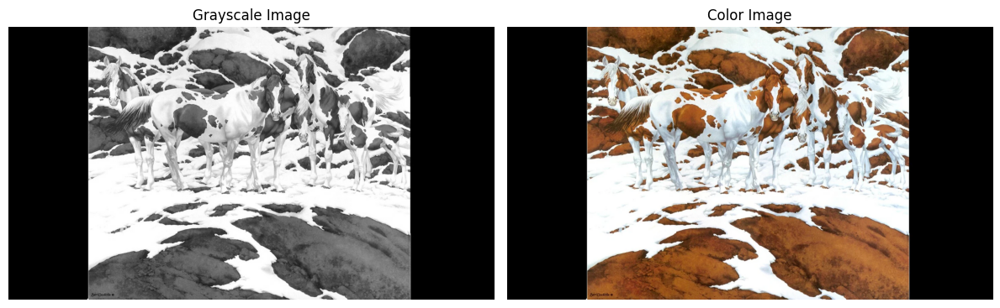

In [48]:
# Load a grayscale image
img_gray = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)

# Load a color image (BGR format in OpenCV!)
img_color = cv2.imread('how-many-horses.webp', cv2.IMREAD_COLOR)

print(f"Grayscale image shape: {img_gray.shape}")  # (height, width)
print(f"Color image shape: {img_color.shape}")     # (height, width, channels)
print(f"Data type: {img_gray.dtype}")              # uint8 (0-255)

# Display
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_gray, cmap='gray')
axes[0].set_title('Grayscale Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
axes[1].set_title('Color Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()

## 2. Accessing and Modifying Pixels (اسلاید 8-9)

You can access individual pixels using array indexing.

Pixel at (100, 100): 255


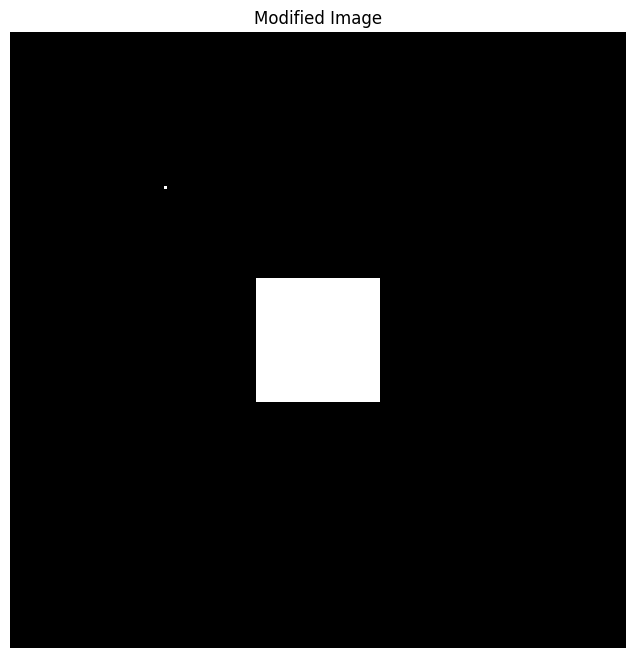

In [49]:
# Create a simple image
img = np.zeros((200, 200), dtype=np.uint8)

# Set individual pixels
img[50, 50] = 255  # White pixel at (50, 50)
img[100, 100] = 128  # Gray pixel

# Draw a white square
img[80:120, 80:120] = 255

# Access pixel value
pixel_value = img[100, 100]
print(f"Pixel at (100, 100): {pixel_value}")

plt.imshow(img, cmap='gray')
plt.title('Modified Image')
plt.axis('off')
plt.show()

## 3. Sampling - Changing Resolution (اسلاید 10-11)

Reducing resolution affects detail visibility.

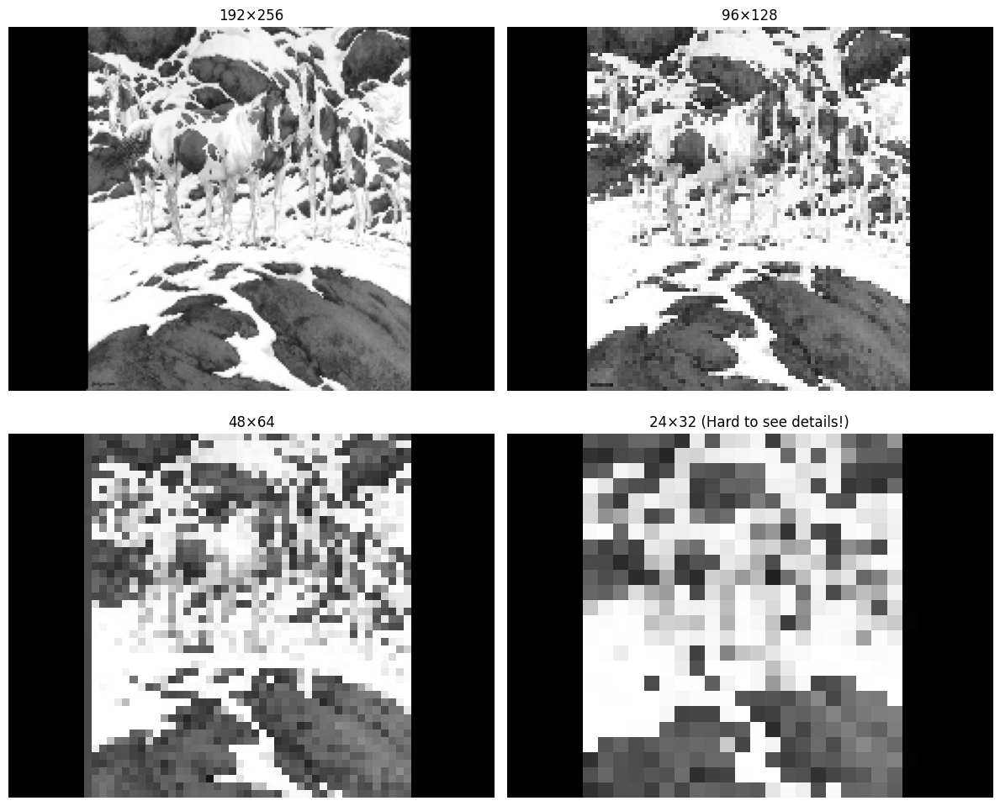

In [50]:
# Load image
img = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)

# Different resolutions
img_192x256 = cv2.resize(img, (256, 192))
img_96x128 = cv2.resize(img, (128, 96))
img_48x64 = cv2.resize(img, (64, 48))
img_24x32 = cv2.resize(img, (32, 24))

# Display
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(img_192x256, cmap='gray')
axes[0, 0].set_title('192×256')
axes[0, 1].imshow(img_96x128, cmap='gray')
axes[0, 1].set_title('96×128')
axes[1, 0].imshow(img_48x64, cmap='gray')
axes[1, 0].set_title('48×64')
axes[1, 1].imshow(img_24x32, cmap='gray')
axes[1, 1].set_title('24×32 (Hard to see details!)')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 4. Quantization - Reducing Bit Depth (اسلاید 12-13)

Reducing the number of bits per pixel.

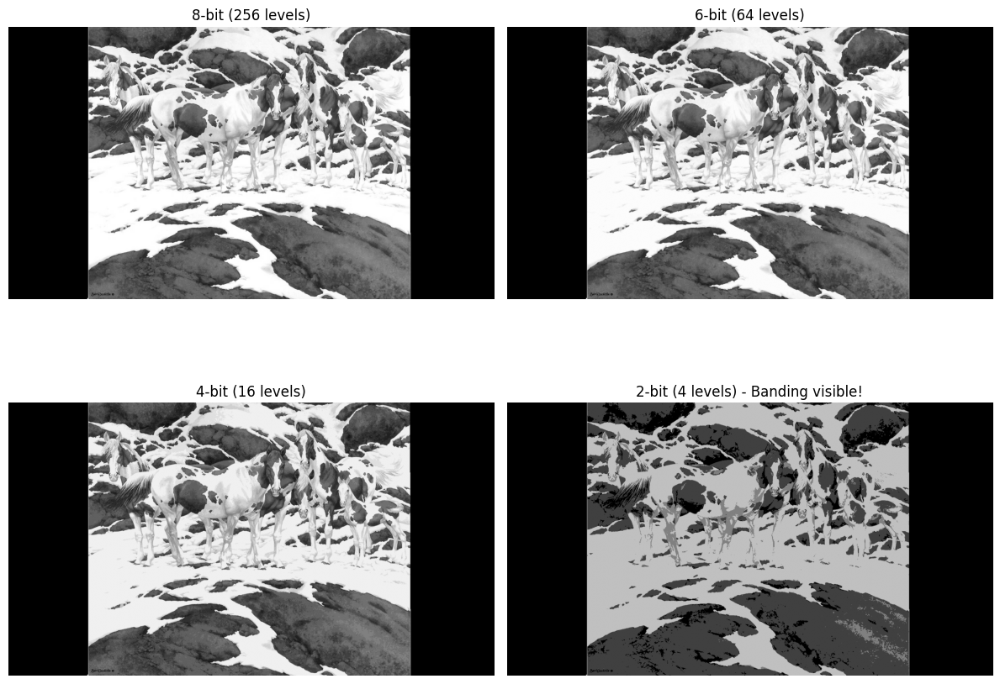

In [51]:
# Load image
img = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)

# 8-bit (256 levels) - original
img_8bit = img.copy()

# 6-bit (64 levels)
img_6bit = (img >> 2) << 2

# 4-bit (16 levels)
img_4bit = (img >> 4) << 4

# 2-bit (4 levels)
img_2bit = (img >> 6) << 6

# Display
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(img_8bit, cmap='gray', vmin=0, vmax=255)
axes[0, 0].set_title('8-bit (256 levels)')
axes[0, 1].imshow(img_6bit, cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('6-bit (64 levels)')
axes[1, 0].imshow(img_4bit, cmap='gray', vmin=0, vmax=255)
axes[1, 0].set_title('4-bit (16 levels)')
axes[1, 1].imshow(img_2bit, cmap='gray', vmin=0, vmax=255)
axes[1, 1].set_title('2-bit (4 levels) - Banding visible!')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 5. Color Spaces - RGB Channels (اسلاید 16-22)

OpenCV uses BGR (not RGB!) by default.

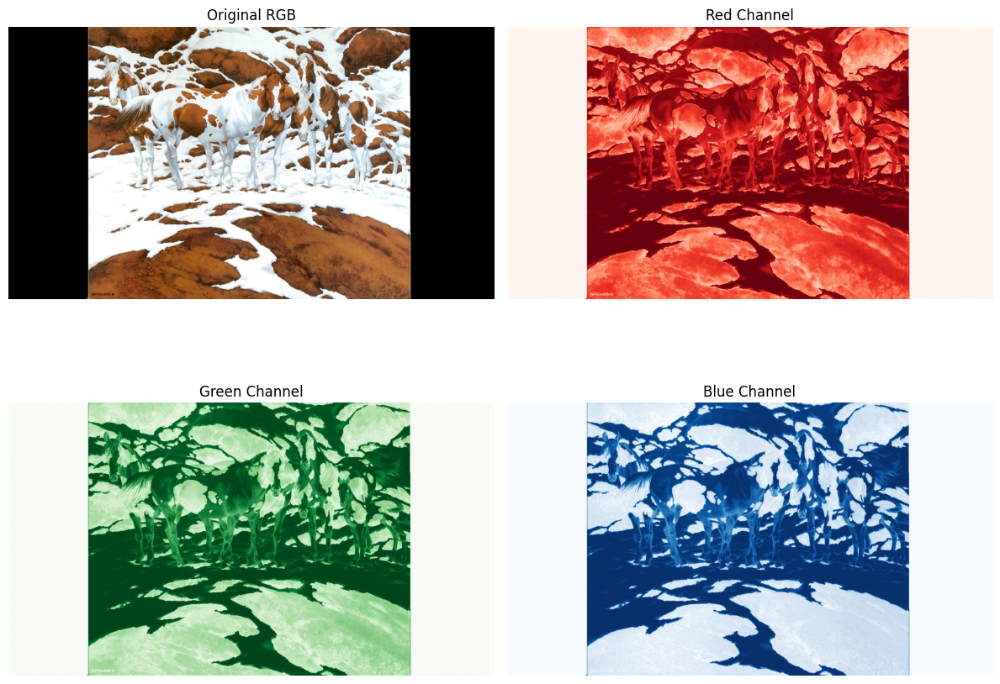

In [52]:
# Load color image
img_bgr = cv2.imread('how-many-horses.webp', cv2.IMREAD_COLOR)

# Split into channels
b, g, r = cv2.split(img_bgr)

# Display
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original RGB')

axes[0, 1].imshow(r, cmap='Reds')
axes[0, 1].set_title('Red Channel')

axes[1, 0].imshow(g, cmap='Greens')
axes[1, 0].set_title('Green Channel')

axes[1, 1].imshow(b, cmap='Blues')
axes[1, 1].set_title('Blue Channel')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 6. Color Space Conversions (اسلاید 19-31)

Converting between different color representations.

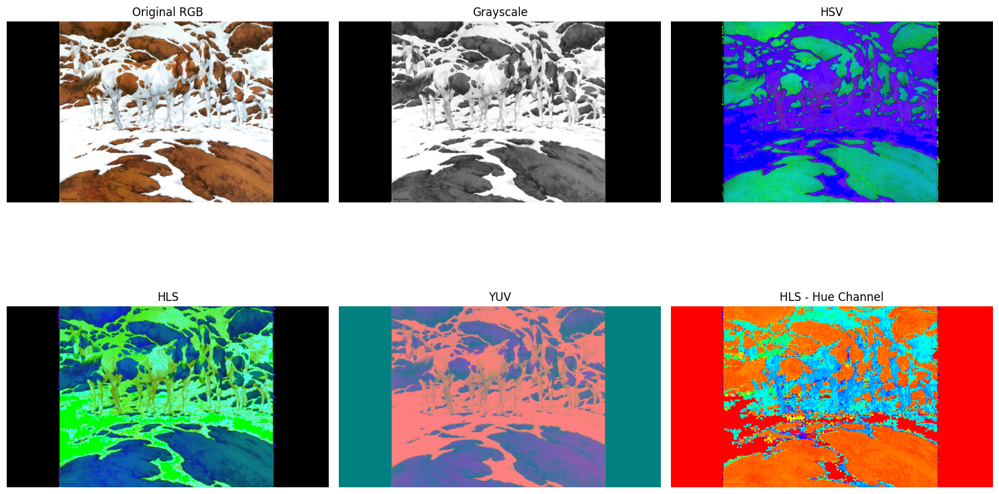

HSV ranges in OpenCV: H=[0,179], S=[0,255], V=[0,255]
HLS ranges in OpenCV: H=[0,179], L=[0,255], S=[0,255]


In [53]:
# Load image
img_bgr = cv2.imread('how-many-horses.webp', cv2.IMREAD_COLOR)

# Convert to different color spaces
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
img_hls = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HLS)
img_yuv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YUV)

# Display
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original RGB')

axes[0, 1].imshow(img_gray, cmap='gray')
axes[0, 1].set_title('Grayscale')

axes[0, 2].imshow(img_hsv)
axes[0, 2].set_title('HSV')

axes[1, 0].imshow(img_hls)
axes[1, 0].set_title('HLS')

axes[1, 1].imshow(img_yuv)
axes[1, 1].set_title('YUV')

# Show H, L, S channels separately
h, l, s = cv2.split(img_hls)
axes[1, 2].imshow(h, cmap='hsv')
axes[1, 2].set_title('HLS - Hue Channel')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

print(f"HSV ranges in OpenCV: H=[0,179], S=[0,255], V=[0,255]")
print(f"HLS ranges in OpenCV: H=[0,179], L=[0,255], S=[0,255]")

## 7. Adding Gaussian Noise (اسلاید 38-40)

Simulating camera sensor noise.

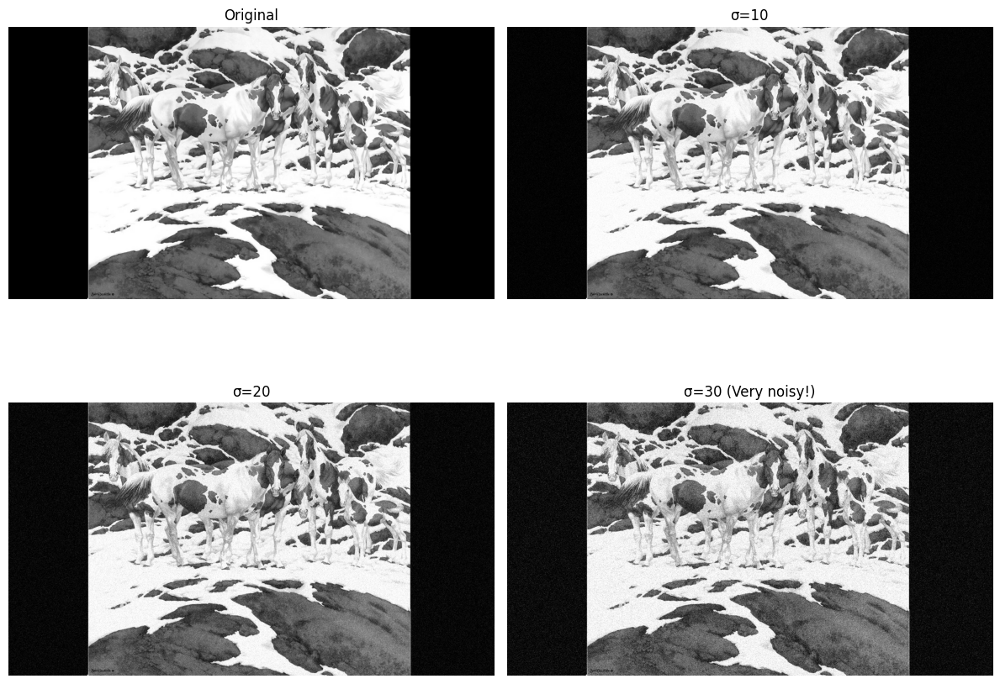

In [54]:
def add_gaussian_noise(image, mean=0, sigma=20):
    """Add Gaussian noise to image"""
    # Convert to 16-bit signed to handle negative noise
    img_16 = image.astype(np.int16)
    
    # Generate Gaussian noise
    noise = np.random.normal(mean, sigma, image.shape).astype(np.int16)
    
    # Add noise
    noisy = img_16 + noise
    
    # Clip to valid range
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy

# Load image
img = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)

# Add different levels of noise
noisy_10 = add_gaussian_noise(img, sigma=10)
noisy_20 = add_gaussian_noise(img, sigma=20)
noisy_30 = add_gaussian_noise(img, sigma=30)

# Display
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original')
axes[0, 1].imshow(noisy_10, cmap='gray')
axes[0, 1].set_title('σ=10')
axes[1, 0].imshow(noisy_20, cmap='gray')
axes[1, 0].set_title('σ=20')
axes[1, 1].imshow(noisy_30, cmap='gray')
axes[1, 1].set_title('σ=30 (Very noisy!)')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 8. Adding Salt & Pepper Noise (اسلاید 41-43)

Random black and white pixels.

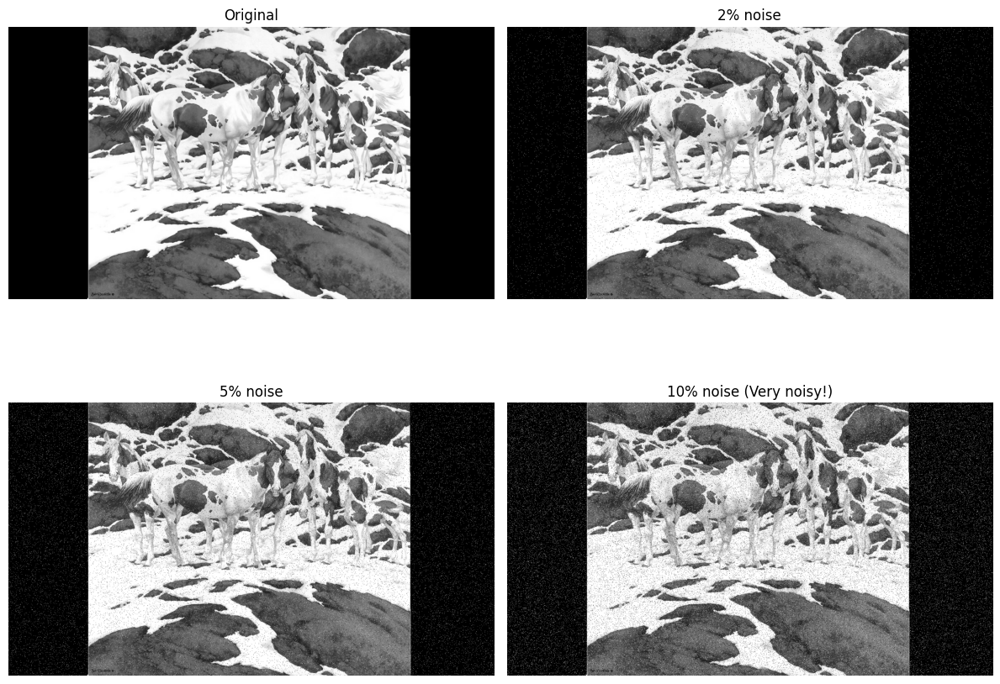

In [55]:
def add_salt_pepper(image, amount=0.05):
    """Add salt and pepper noise"""
    noisy = image.copy()
    num_pixels = int(amount * image.size)
    
    # Add salt (white)
    for _ in range(num_pixels // 2):
        row = np.random.randint(0, image.shape[0])
        col = np.random.randint(0, image.shape[1])
        noisy[row, col] = 255
    
    # Add pepper (black)
    for _ in range(num_pixels // 2):
        row = np.random.randint(0, image.shape[0])
        col = np.random.randint(0, image.shape[1])
        noisy[row, col] = 0
    
    return noisy

# Load image
img = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)

# Add different amounts
noisy_2 = add_salt_pepper(img, amount=0.02)
noisy_5 = add_salt_pepper(img, amount=0.05)
noisy_10 = add_salt_pepper(img, amount=0.10)

# Display
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original')
axes[0, 1].imshow(noisy_2, cmap='gray')
axes[0, 1].set_title('2% noise')
axes[1, 0].imshow(noisy_5, cmap='gray')
axes[1, 0].set_title('5% noise')
axes[1, 1].imshow(noisy_10, cmap='gray')
axes[1, 1].set_title('10% noise (Very noisy!)')

for ax in axes.flat:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 9. Smoothing Filters (اسلاید 51-53)

Removing noise using different filters.

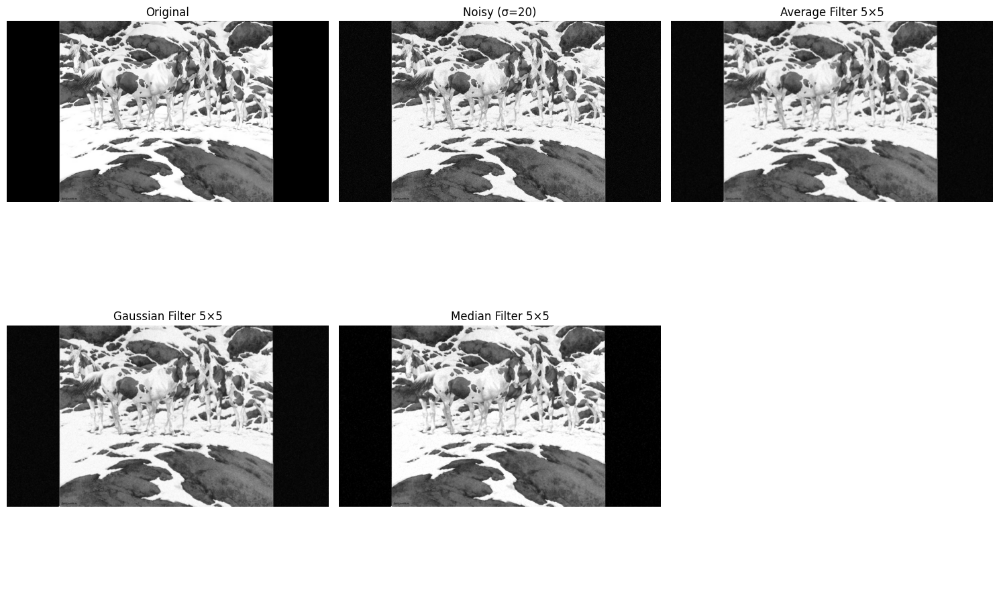

In [56]:
# Load and add noise
img = cv2.imread('how-many-horses.webp', cv2.IMREAD_GRAYSCALE)
noisy = add_gaussian_noise(img, sigma=20)

# Apply different filters
blur_avg = cv2.blur(noisy, (5, 5))  # Local average
blur_gauss = cv2.GaussianBlur(noisy, (5, 5), 1.5)  # Gaussian
blur_median = cv2.medianBlur(noisy, 5)  # Median

# Display
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(img, cmap='gray')
axes[0, 0].set_title('Original')

axes[0, 1].imshow(noisy, cmap='gray')
axes[0, 1].set_title('Noisy (σ=20)')

axes[0, 2].imshow(blur_avg, cmap='gray')
axes[0, 2].set_title('Average Filter 5×5')

axes[1, 0].imshow(blur_gauss, cmap='gray')
axes[1, 0].set_title('Gaussian Filter 5×5')

axes[1, 1].imshow(blur_median, cmap='gray')
axes[1, 1].set_title('Median Filter 5×5')

axes[1, 2].axis('off')

for ax in axes.flat[:-1]:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 10. Your Turn! Practice Exercise

Try these exercises yourself:

In [57]:
# Exercise 1: Load an image and convert it to HLS, then extract the Hue channel
# Your code here:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import Image

%matplotlib inline


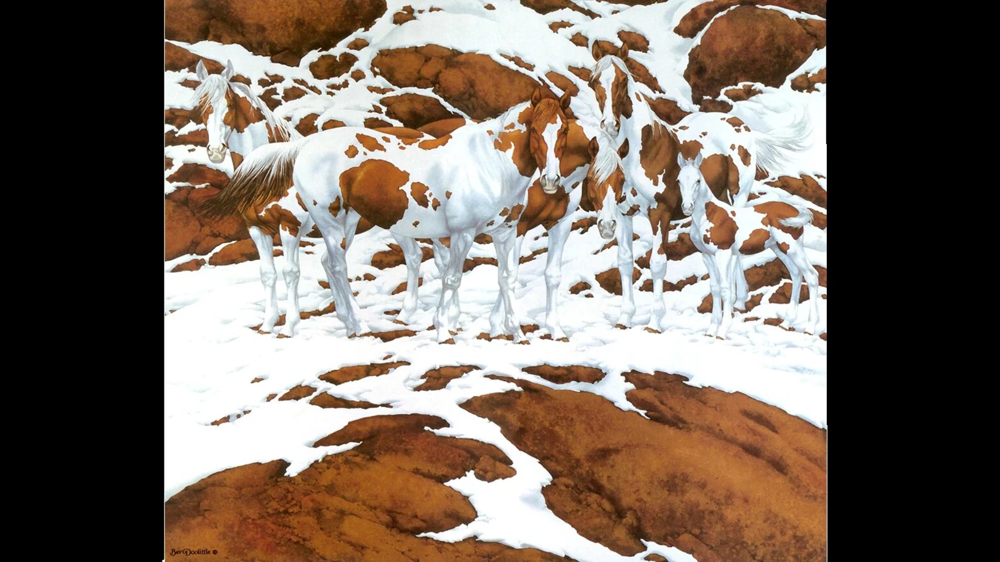

In [58]:
# Exercise 2: Add salt & pepper noise, then try different filters to remove it
# Which filter works best?
# Your code here:
# Display 18x18 pixel image.
Image(filename="how-many-horses.webp")


In [59]:
# Exercise 3: Create a gradient image (like in slide 9)
# Hint: Use nested loops or np.arange
# Your code here:

cb_img = cv2.imread("how-many-horses.webp")

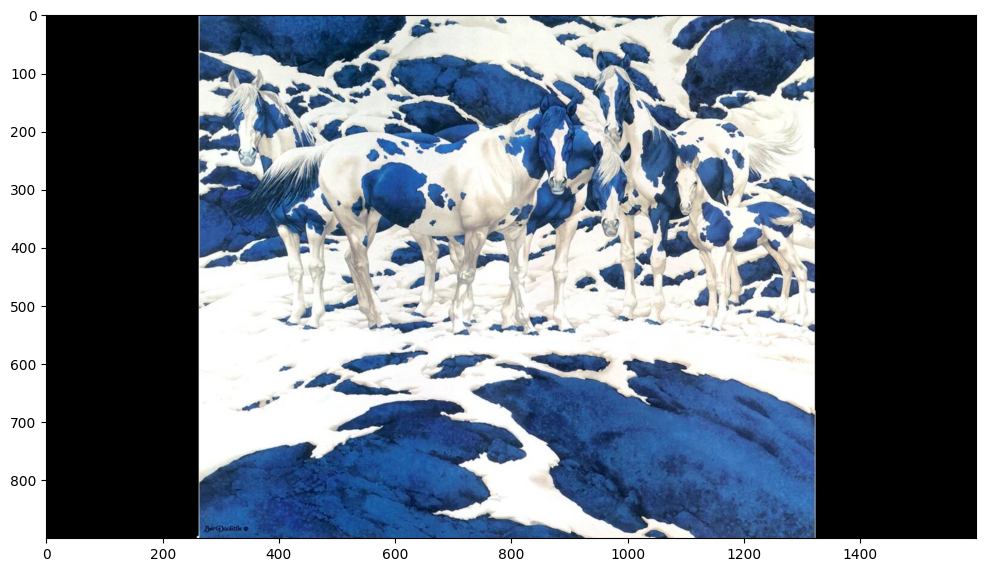

In [60]:
plt.imshow(cb_img)

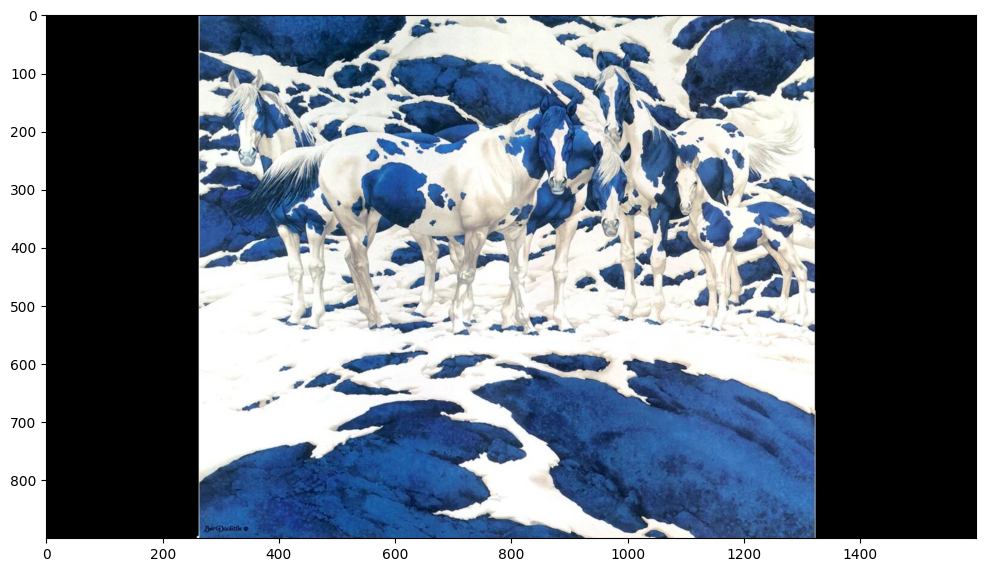

In [61]:
plt.imshow(cb_img, cmap="gray")